In [2]:
import os
import glob
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

COLUMN_NAMES = [
    'acc_chest_x', 'acc_chest_y', 'acc_chest_z',    # 0-2 (Chest Acc)
    'ecg_1', 'ecg_2',                               # 3-4 (ECG)
    'acc_ankle_x', 'acc_ankle_y', 'acc_ankle_z',    # 5-7 (Ankle Acc)
    'gyro_ankle_x', 'gyro_ankle_y', 'gyro_ankle_z', # 8-10 (Ankle Gyro)
    'mag_ankle_x', 'mag_ankle_y', 'mag_ankle_z',    # 11-13 (Ankle Mag)
    'acc_arm_x', 'acc_arm_y', 'acc_arm_z',          # 14-16 (Arm Acc)
    'gyro_arm_x', 'gyro_arm_y', 'gyro_arm_z',       # 17-19 (Arm Gyro)
    'mag_arm_x', 'mag_arm_y', 'mag_arm_z',          # 20-22 (Arm Mag)
    'activity_id'                                   # 23 (Label)
]

target_activities = {
    4: 'Walking',                   # 비교군 1 (동작의 구분감)
    6: 'Waist bends forward',       # 후보 1
    7: 'Frontal elevation of arms', # 후보 2
    8: 'Knees bending',             # 후보 3
    9: 'Cycling',                   # 비교군 2 (동작 속도의 적합성)
    12: 'Jump front & back'         # 비교군 3 (단축 동작)
}

def load_mhealth_dataset(data_dir='./'):
    full_dataset = {}

    file_list = sorted(glob.glob(os.path.join(data_dir, "mHealth_subject*.log")))

    if not file_list:
        print(f"Error: No files found in directory '{data_dir}'. Check the path and file names.")
        return {}

    for file_path in file_list:
        file_name = os.path.basename(file_path)
        subj_id = file_name.split('.')[0].replace('_', '')

        df = pd.read_csv(file_path, sep="\t", header=None)
        if df.shape[1] == len(COLUMN_NAMES):
            df.columns = COLUMN_NAMES
        else:
            print(f"Warning: {subj_id} has {df.shape[1]} columns, expected {len(COLUMN_NAMES)}.")

        subj_data = {}

        for label_code, activity_name in target_activities.items():
            activity_df = df[df['activity_id'] == label_code].copy()

            if not activity_df.empty:
                subj_data[activity_name] = activity_df.drop(columns=['activity_id'])

        full_dataset[subj_id] = subj_data

    print(f"\nSuccessfully loaded data for {len(full_dataset)} subjects.")
    return full_dataset

data_directory = '/content/drive/MyDrive/Colab Notebooks/HAR_data/MHEALTHDATASET'
mhealth_data = load_mhealth_dataset(data_directory)


Successfully loaded data for 10 subjects.


Plotting Knees bending (Time Domain) for 10 subjects...


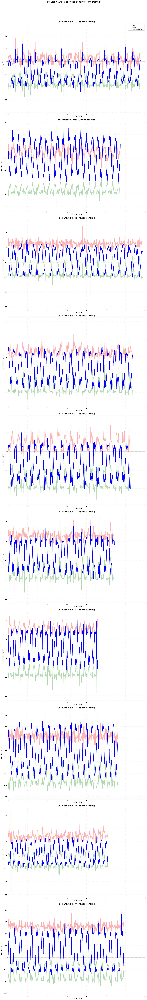

In [3]:
import matplotlib.pyplot as plt
import math

def plot_knees_bending_time(dataset):
    subjects = sorted(list(dataset.keys()))
    num_subjects = len(subjects)

    if num_subjects == 0:
        print("No data to plot.")
        return

    cols = 1
    rows = math.ceil(num_subjects / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(15, 10 * rows), constrained_layout=True)
    axes = axes.flatten()

    target_activity = 'Knees bending'
    fs = 50.0  # MHEALTH 데이터셋의 샘플링 주파수는 50Hz입니다.

    print(f"Plotting {target_activity} (Time Domain) for {num_subjects} subjects...")

    for i, subj_id in enumerate(subjects):
        ax = axes[i]

        if target_activity in dataset[subj_id]:
            df = dataset[subj_id][target_activity]
            df = df.reset_index(drop=True)

            # X축 변환: Sample Index -> Time (seconds)
            time_axis = df.index / fs

            # 1. 보조축 (X, Y) - alpha=0.5
            ax.plot(time_axis, df['acc_ankle_x'], label='Acc X', color='red', alpha=0.3, linewidth=1)
            ax.plot(time_axis, df['acc_ankle_y'], label='Acc Y', color='green', alpha=0.3, linewidth=1)

            # 2. 주축 (Z) - 진하게 (Default)
            ax.plot(time_axis, df['acc_ankle_z'], label='Acc Z (Dominant)', color='blue', alpha=1.0, linewidth=2)

            ax.set_title(f"{subj_id} - {target_activity}", fontsize=14, fontweight='bold')
            ax.set_xlabel("Time (seconds)")  # 라벨 변경
            ax.set_ylabel("Acceleration (m/s^2)")
            ax.set_xlim(0, 70) # 넉넉하게 70초까지 (보통 60초 내외)
            ax.grid(True, linestyle='--', alpha=0.6)

            # 범례는 첫 번째 그래프에만 표시 (깔끔하게)
            if i == 0:
                ax.legend(loc='upper right')

        else:
            ax.text(0.5, 0.5, 'No Data', horizontalalignment='center', verticalalignment='center')
            ax.set_title(f"{subj_id} - No Data")

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.suptitle(f"Raw Signal Analysis: {target_activity} (Time Domain)", fontsize=16, y=1.02)
    plt.show()

plot_knees_bending_time(mhealth_data)

Plotting Waist bends forward (Time Domain) for 10 subjects...


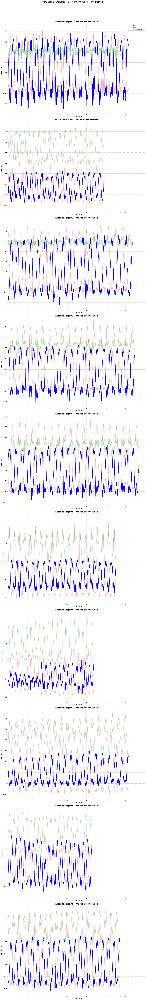

In [4]:
import matplotlib.pyplot as plt
import math

def plot_knees_bending_time(dataset):
    subjects = sorted(list(dataset.keys()))
    num_subjects = len(subjects)

    if num_subjects == 0:
        print("No data to plot.")
        return

    cols = 1
    rows = math.ceil(num_subjects / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(15, 10 * rows), constrained_layout=True)
    axes = axes.flatten()

    target_activity = 'Waist bends forward'
    fs = 50.0  # MHEALTH 데이터셋의 샘플링 주파수는 50Hz입니다.

    print(f"Plotting {target_activity} (Time Domain) for {num_subjects} subjects...")

    for i, subj_id in enumerate(subjects):
        ax = axes[i]

        if target_activity in dataset[subj_id]:
            df = dataset[subj_id][target_activity]
            df = df.reset_index(drop=True)

            # X축 변환: Sample Index -> Time (seconds)
            time_axis = df.index / fs

            # 1. 보조축 (X, Y) - alpha=0.5
            ax.plot(time_axis, df['acc_chest_x'], label='Acc X', color='red', alpha=0.3, linewidth=1)
            ax.plot(time_axis, df['acc_chest_y'], label='Acc Y', color='green', alpha=0.3, linewidth=1)

            # 2. 주축 (Z) - 진하게 (Default)
            ax.plot(time_axis, df['acc_chest_z'], label='Acc Z (Dominant)', color='blue', alpha=1.0, linewidth=2)

            ax.set_title(f"{subj_id} - {target_activity}", fontsize=14, fontweight='bold')
            ax.set_xlabel("Time (seconds)")  # 라벨 변경
            ax.set_ylabel("Acceleration (m/s^2)")
            ax.set_xlim(0, 70) # 넉넉하게 70초까지 (보통 60초 내외)
            ax.grid(True, linestyle='--', alpha=0.6)

            # 범례는 첫 번째 그래프에만 표시 (깔끔하게)
            if i == 0:
                ax.legend(loc='upper right')

        else:
            ax.text(0.5, 0.5, 'No Data', horizontalalignment='center', verticalalignment='center')
            ax.set_title(f"{subj_id} - No Data")

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.suptitle(f"Raw Signal Analysis: {target_activity} (Time Domain)", fontsize=16, y=1.02)
    plt.show()

plot_knees_bending_time(mhealth_data)

Plotting Frontal elevation of arms (Time Domain) for 10 subjects...


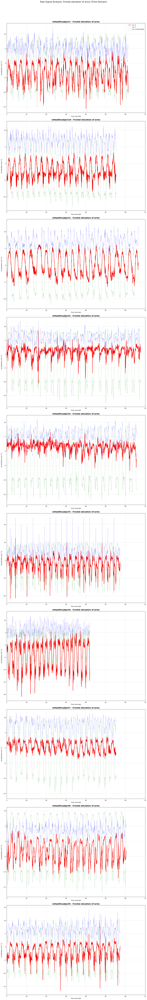

In [5]:
import matplotlib.pyplot as plt
import math

def plot_knees_bending_time(dataset):
    subjects = sorted(list(dataset.keys()))
    num_subjects = len(subjects)

    if num_subjects == 0:
        print("No data to plot.")
        return

    cols = 1
    rows = math.ceil(num_subjects / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(15, 10 * rows), constrained_layout=True)
    axes = axes.flatten()

    target_activity = 'Frontal elevation of arms'
    fs = 50.0  # MHEALTH 데이터셋의 샘플링 주파수는 50Hz입니다.

    print(f"Plotting {target_activity} (Time Domain) for {num_subjects} subjects...")

    for i, subj_id in enumerate(subjects):
        ax = axes[i]

        if target_activity in dataset[subj_id]:
            df = dataset[subj_id][target_activity]
            df = df.reset_index(drop=True)

            # X축 변환: Sample Index -> Time (seconds)
            time_axis = df.index / fs

            # 1. 보조축 (X, Y) - alpha=0.5
            ax.plot(time_axis, df['acc_arm_x'], label='Acc X', color='red', alpha=1.0, linewidth=2)
            ax.plot(time_axis, df['acc_arm_y'], label='Acc Y', color='green', alpha=0.3, linewidth=1)

            # 2. 주축 (Z) - 진하게 (Default)
            ax.plot(time_axis, df['acc_arm_z'], label='Acc Z (Dominant)', color='blue', alpha=0.3, linewidth=1)

            ax.set_title(f"{subj_id} - {target_activity}", fontsize=14, fontweight='bold')
            ax.set_xlabel("Time (seconds)")  # 라벨 변경
            ax.set_ylabel("Acceleration (m/s^2)")
            ax.set_xlim(0, 70) # 넉넉하게 70초까지 (보통 60초 내외)
            ax.grid(True, linestyle='--', alpha=0.6)

            # 범례는 첫 번째 그래프에만 표시 (깔끔하게)
            if i == 0:
                ax.legend(loc='upper right')

        else:
            ax.text(0.5, 0.5, 'No Data', horizontalalignment='center', verticalalignment='center')
            ax.set_title(f"{subj_id} - No Data")

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.suptitle(f"Raw Signal Analysis: {target_activity} (Time Domain)", fontsize=16, y=1.02)
    plt.show()

plot_knees_bending_time(mhealth_data)

            subject  n_samples  seconds
1  mHealthsubject10       1024    20.48
2   mHealthsubject2       1024    20.48
3   mHealthsubject3       1024    20.48
4   mHealthsubject4       1024    20.48
6   mHealthsubject6       1024    20.48
5   mHealthsubject5       1024    20.48
7   mHealthsubject7       1024    20.48
8   mHealthsubject8       1024    20.48
0   mHealthsubject1       1075    21.50
9   mHealthsubject9       1075    21.50

min/median/max seconds: 20.48 20.48 21.5
Plotting Jump front & back (Time Domain) for 10 subjects...


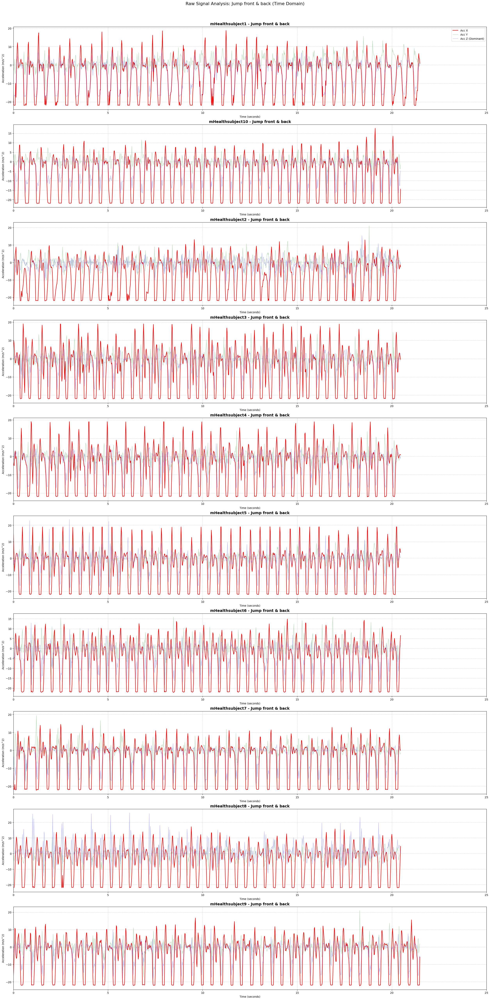

In [19]:
import matplotlib.pyplot as plt
import math

def plot_knees_bending_time(dataset):
    subjects = sorted(list(dataset.keys()))
    num_subjects = len(subjects)

    if num_subjects == 0:
        print("No data to plot.")
        return

    cols = 1
    rows = math.ceil(num_subjects / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(25, 5 * rows), constrained_layout=True)
    axes = axes.flatten()

    target_activity = 'Jump front & back'
    fs = 50.0  # MHEALTH 데이터셋의 샘플링 주파수는 50Hz입니다.

    durations = []
    for subj_id, acts in mhealth_data.items():
        if target_activity in acts:
            n = len(acts[target_activity])
            durations.append((subj_id, n, n/fs))

    dur_df = pd.DataFrame(durations, columns=["subject", "n_samples", "seconds"]).sort_values("seconds")
    print(dur_df)
    print("\nmin/median/max seconds:",
        dur_df["seconds"].min(),
        dur_df["seconds"].median(),
        dur_df["seconds"].max())

    print(f"Plotting {target_activity} (Time Domain) for {num_subjects} subjects...")

    for i, subj_id in enumerate(subjects):
        ax = axes[i]

        if target_activity in dataset[subj_id]:
            df = dataset[subj_id][target_activity]
            df = df.reset_index(drop=True)

            # X축 변환: Sample Index -> Time (seconds)
            time_axis = df.index / fs

            # 1. 보조축 (X, Y) - alpha=0.5
            ax.plot(time_axis, df['acc_chest_x'], label='Acc X', color='red', alpha=1.0, linewidth=1.7)
            ax.plot(time_axis, df['acc_chest_y'], label='Acc Y', color='green', alpha=0.3, linewidth=1)

            # 2. 주축 (Z) - 진하게 (Default)
            ax.plot(time_axis, df['acc_chest_z'], label='Acc Z (Dominant)', color='blue', alpha=0.3, linewidth=1)

            ax.set_title(f"{subj_id} - {target_activity}", fontsize=14, fontweight='bold')
            ax.set_xlabel("Time (seconds)")  # 라벨 변경
            ax.set_ylabel("Acceleration (m/s^2)")
            ax.set_xlim(0, 25) # 넉넉하게 70초까지 (보통 60초 내외)
            ax.grid(True, linestyle='--', alpha=0.6)

            # 범례는 첫 번째 그래프에만 표시 (깔끔하게)
            if i == 0:
                ax.legend(loc='upper right')

        else:
            ax.text(0.5, 0.5, 'No Data', horizontalalignment='center', verticalalignment='center')
            ax.set_title(f"{subj_id} - No Data")

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.suptitle(f"Raw Signal Analysis: {target_activity} (Time Domain)", fontsize=16, y=1.02)
    plt.show()

plot_knees_bending_time(mhealth_data)